# DECISION TREE CLASSIFIER

# 2018 - 2019 Test Dataset

## Libraries and Data Loading

In [246]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn.preprocessing import OneHotEncoder
from sklearn import tree
from sklearn.metrics import plot_confusion_matrix
from sklearn.datasets import load_iris
from sklearn import tree
import graphviz 
from sklearn.metrics import classification_report, confusion_matrix

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [18]:
df = pd.read_csv('2018-2019_Model_Ready.csv', index_col=0)
df.head(2).append(df.tail(2))

,Game_Result,Team1_OFFRTG,Team1_DEFRTG,Team1_AST/TO,Team1_REB_P,Team1_FG_P,Team1_FGA,Team1_PACE,Team1_3PA,Team1_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_AST/TO,Team2_REB_P,Team2_FG_P,Team2_FGA,Team2_PACE,Team2_3PA,Team2_3P_P
0,1,106.3,107.5,1.83,51.1,43.5,93.1,104.39,35.9,33.8,100.8,96.2,1.66,50.6,41.8,89.3,101.50,33.6,32.8
1,1,102.4,105.0,1.30,50.8,42.8,93.8,106.08,29.7,27.5,120.3,107.5,2.00,51.1,52.4,89.1,104.00,31.9,41.8
1276,1,111.5,105.4,2.36,48.3,46.3,90.2,100.80,33.2,36.1,113.0,110.9,1.86,50.7,47.4,93.2,109.70,37.8,33.3
1277,1,126.0,103.9,2.65,49.0,48.2,94.2,102.10,53.6,41.4,113.7,103.7,2.02,49.4,50.6,92.5,103.42,35.7,41.1


## Data Description

In [19]:
df.describe()

,Game_Result,Team1_OFFRTG,Team1_DEFRTG,Team1_AST/TO,Team1_REB_P,Team1_FG_P,Team1_FGA,Team1_PACE,Team1_3PA,Team1_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_AST/TO,Team2_REB_P,Team2_FG_P,Team2_FGA,Team2_PACE,Team2_3PA,Team2_3P_P
count,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.000000,1190.00000,1190.000000
mean,0.596639,109.815126,109.752605,1.782294,50.001345,46.092101,89.255294,100.591008,32.272941,35.466975,109.840000,109.534034,1.783227,50.066723,46.036218,89.393866,100.618723,32.38000,35.512941
std,0.490778,4.631327,4.230216,0.287058,2.089647,2.005859,3.119768,2.736351,4.900041,2.632720,4.546513,4.195836,0.279797,2.074435,2.034172,3.183965,2.675570,4.92936,2.682316
min,0.000000,97.500000,96.200000,1.210000,43.300000,41.000000,80.100000,94.720000,21.400000,27.500000,97.500000,96.200000,1.210000,43.300000,41.000000,80.100000,94.720000,21.40000,27.500000
25%,0.000000,106.700000,106.925000,1.570000,48.700000,44.700000,87.300000,98.732500,28.700000,33.800000,106.800000,106.900000,1.570000,48.900000,44.600000,87.300000,98.790000,28.92500,33.800000
50%,1.000000,110.000000,109.700000,1.780000,50.000000,46.000000,89.500000,100.570000,32.400000,35.400000,110.100000,109.600000,1.780000,50.100000,46.000000,89.500000,100.560000,32.40000,35.500000
75%,1.000000,112.900000,112.375000,1.960000,51.400000,47.200000,91.200000,102.430000,34.875000,36.800000,112.900000,112.100000,1.960000,51.400000,47.300000,91.300000,102.310000,34.90000,37.000000
max,1.000000,126.000000,122.700000,2.650000,56.500000,52.400000,98.500000,109.700000,53.600000,43.500000,126.000000,122.700000,2.650000,56.500000,52.400000,98.500000,109.700000,53.60000,43.500000


## Features, Labels, Training, and Test Data Creation

In [66]:
# Target Variable
df['Game_Result'].value_counts()

1    710
0    480
Name: Game_Result, dtype: int64

In [67]:
# Create features (X) and labels (y)
y = df['Game_Result']
X = df.drop(['Game_Result'], axis=1)

In [68]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10)

## Training classifier and making predictions

In [69]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [70]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

## Checking predictive performance

In [71]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :61.74496644295302

AUC is :0.61

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,65,54,119
1,60,119,179
All,125,173,298


Accuracy is rather low at 61.74%. Lets plot the confusion matrix:

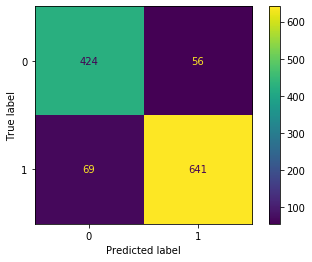

In [37]:
# Alternative confusion matrix
plot_confusion_matrix(classifier, X, y, values_format='.3g')
plt.show()

<b>Observations</b>

*

## Displaying Decision Tree using Entropy

In [31]:
# Instantiate and fit a DecisionTreeClassifier
classifier_2 = DecisionTreeClassifier(random_state=42, criterion='entropy')  
classifier_2.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

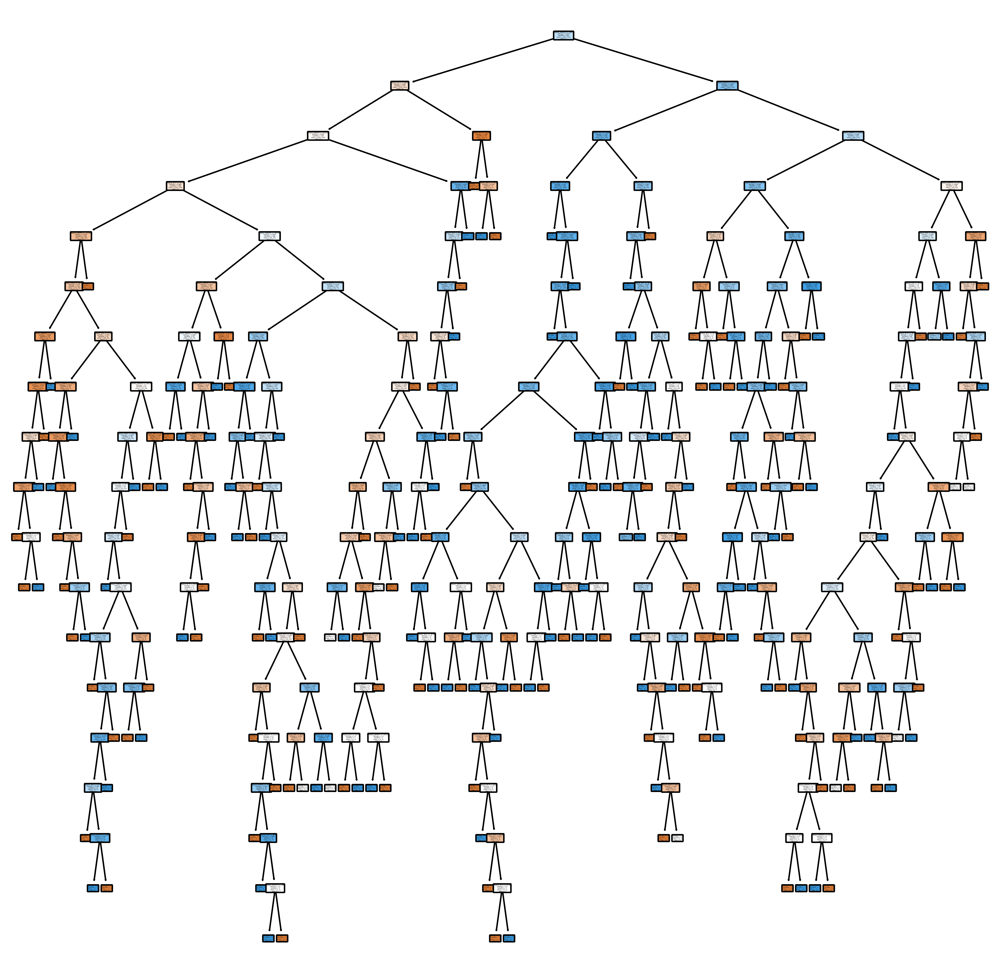

In [32]:
# Plot and show decision tree
plt.figure(figsize=(12,12), dpi=500)
tree.plot_tree(classifier_2, 
               feature_names=X.columns,
               class_names=np.unique(y).astype('str'),
               filled=True, rounded=True)
plt.show()

There seems to be some room for improvement. Maybe if I normalize/scale the data? or maybe try to eliminate outliers? are there really outliers if these are real basketball game averages values from the stats.nba.com website which is the most thorough basketball webpage in the world?

## Model Test I

In [284]:
df_merge = pd.read_csv('df_merge.csv', index_col=0)
df_merge.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_month,Team1_OFFRTG,Team1_DEFRTG,Team1_AST/TO,Team1_REB_P,Team1_FG_P,Team1_FGA,Team1_PACE,Team1_3PA,Team1_3P_P,Team2_month,Team2_OFFRTG,Team2_DEFRTG,Team2_AST/TO,Team2_REB_P,Team2_FG_P,Team2_FGA,Team2_PACE,Team2_3PA,Team2_3P_P
0,Philadelphia 76ers,87,Boston Celtics,105,2018,10,1,10.0,106.3,107.5,1.83,51.1,43.5,93.1,104.39,35.9,33.8,10.0,100.8,96.2,1.66,50.6,41.8,89.3,101.5,33.6,32.8
1,Oklahoma City Thunder,100,Golden State Warriors,108,2018,10,1,10.0,102.4,105.0,1.30,50.8,42.8,93.8,106.08,29.7,27.5,10.0,120.3,107.5,2.00,51.1,52.4,89.1,104.0,31.9,41.8


In [285]:
df_SAS = df_merge[df_merge['Team2'] == 'San Antonio Spurs']
df_SAS.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_month,Team1_OFFRTG,Team1_DEFRTG,Team1_AST/TO,Team1_REB_P,Team1_FG_P,Team1_FGA,Team1_PACE,Team1_3PA,Team1_3P_P,Team2_month,Team2_OFFRTG,Team2_DEFRTG,Team2_AST/TO,Team2_REB_P,Team2_FG_P,Team2_FGA,Team2_PACE,Team2_3PA,Team2_3P_P
9,Minnesota Timberwolves,108,San Antonio Spurs,112,2018,10,1,10.0,111.4,114.2,1.64,48.7,44.8,92.4,103.94,28.9,38.1,10.0,111.9,110.6,2.02,50.8,46.6,91.7,99.33,22.3,39.1
57,Indiana Pacers,116,San Antonio Spurs,96,2018,10,0,10.0,112.1,105.5,1.67,49.2,50.6,86.0,97.13,22.3,41.6,10.0,111.9,110.6,2.02,50.8,46.6,91.7,99.33,22.3,39.1


In [287]:
df_SAS = df_SAS.drop(['Team1', 'Team1Score', 'Team2Score', 'Team2', 'year', 'month', 'Team1_month', 'Team2_month'], axis=1)

In [289]:
df_SAS.columns

Index(['Game_Result', 'Team1_OFFRTG', 'Team1_DEFRTG', 'Team1_AST/TO',
       'Team1_REB_P', 'Team1_FG_P', 'Team1_FGA', 'Team1_PACE', 'Team1_3PA',
       'Team1_3P_P', 'Team2_OFFRTG', 'Team2_DEFRTG', 'Team2_AST/TO',
       'Team2_REB_P', 'Team2_FG_P', 'Team2_FGA', 'Team2_PACE', 'Team2_3PA',
       'Team2_3P_P'],
      dtype='object')

In [290]:
df_SAS.Game_Result.value_counts()

1    34
0    10
Name: Game_Result, dtype: int64

In [291]:
df_SAS.isna().sum()

Game_Result     0
Team1_OFFRTG    2
Team1_DEFRTG    2
Team1_AST/TO    2
Team1_REB_P     2
Team1_FG_P      2
Team1_FGA       2
Team1_PACE      2
Team1_3PA       2
Team1_3P_P      2
Team2_OFFRTG    0
Team2_DEFRTG    0
Team2_AST/TO    0
Team2_REB_P     0
Team2_FG_P      0
Team2_FGA       0
Team2_PACE      0
Team2_3PA       0
Team2_3P_P      0
dtype: int64

In [292]:
df_SAS = df_SAS.dropna()

At this point I'm going to save this file so that this calculations don't have to be done again

In [294]:
df_SAS.to_csv('df_SAS_1S.csv')

In [295]:
# Create features (X) and labels (y)
y = df_SAS['Game_Result']
X = df_SAS.drop(['Game_Result'], axis=1)

In [296]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [297]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [298]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

In [299]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :81.81818181818183

AUC is :0.9

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,1,0,1
1,2,8,10
All,3,8,11


## Model Test II

In [191]:
df_merge = pd.read_csv('df_merge.csv', index_col=0)
df_merge.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_month,Team1_OFFRTG,Team1_DEFRTG,Team1_AST/TO,Team1_REB_P,Team1_FG_P,Team1_FGA,Team1_PACE,Team1_3PA,Team1_3P_P,Team2_month,Team2_OFFRTG,Team2_DEFRTG,Team2_AST/TO,Team2_REB_P,Team2_FG_P,Team2_FGA,Team2_PACE,Team2_3PA,Team2_3P_P
0,Philadelphia 76ers,87,Boston Celtics,105,2018,10,1,10.0,106.3,107.5,1.83,51.1,43.5,93.1,104.39,35.9,33.8,10.0,100.8,96.2,1.66,50.6,41.8,89.3,101.5,33.6,32.8
1,Oklahoma City Thunder,100,Golden State Warriors,108,2018,10,1,10.0,102.4,105.0,1.30,50.8,42.8,93.8,106.08,29.7,27.5,10.0,120.3,107.5,2.00,51.1,52.4,89.1,104.0,31.9,41.8


In [207]:
df_MIA = df_merge[df_merge['Team2'] == 'Miami Heat']
df_MIA.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_month,Team1_OFFRTG,Team1_DEFRTG,Team1_AST/TO,Team1_REB_P,Team1_FG_P,Team1_FGA,Team1_PACE,Team1_3PA,Team1_3P_P,Team2_month,Team2_OFFRTG,Team2_DEFRTG,Team2_AST/TO,Team2_REB_P,Team2_FG_P,Team2_FGA,Team2_PACE,Team2_3PA,Team2_3P_P
30,Charlotte Hornets,113,Miami Heat,112,2018,10,0,10.0,114.9,109.1,2.09,49.2,46.3,91.0,100.44,34.5,37.7,10.0,108.9,107.6,1.37,53.6,43.6,91.4,102.71,33.9,35.4
53,New York Knicks,87,Miami Heat,110,2018,10,1,10.0,105.2,109.8,1.39,51.0,43.1,91.8,100.56,30.8,36.2,10.0,108.9,107.6,1.37,53.6,43.6,91.4,102.71,33.9,35.4


In [208]:
df_MIA.Game_Result.value_counts()

0    22
1    19
Name: Game_Result, dtype: int64

In [225]:
df_MIA = df_MIA.drop(['Team1', 'Team1Score', 'Team2Score', 'Team2', 'year', 'month', 'Team1_month', 'Team2_month'], axis=1)

In [226]:
df_MIA.isna().sum()

Game_Result     0
Team1_OFFRTG    0
Team1_DEFRTG    0
Team1_AST/TO    0
Team1_REB_P     0
Team1_FG_P      0
Team1_FGA       0
Team1_PACE      0
Team1_3PA       0
Team1_3P_P      0
Team2_OFFRTG    0
Team2_DEFRTG    0
Team2_AST/TO    0
Team2_REB_P     0
Team2_FG_P      0
Team2_FGA       0
Team2_PACE      0
Team2_3PA       0
Team2_3P_P      0
dtype: int64

In [227]:
df_MIA = df_MIA.dropna()

In [228]:
df_MIA.isna().sum().sum()

0

In [229]:
df_MIA.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40 entries, 30 to 1211
Data columns (total 19 columns):
Game_Result     40 non-null int64
Team1_OFFRTG    40 non-null float64
Team1_DEFRTG    40 non-null float64
Team1_AST/TO    40 non-null float64
Team1_REB_P     40 non-null float64
Team1_FG_P      40 non-null float64
Team1_FGA       40 non-null float64
Team1_PACE      40 non-null float64
Team1_3PA       40 non-null float64
Team1_3P_P      40 non-null float64
Team2_OFFRTG    40 non-null float64
Team2_DEFRTG    40 non-null float64
Team2_AST/TO    40 non-null float64
Team2_REB_P     40 non-null float64
Team2_FG_P      40 non-null float64
Team2_FGA       40 non-null float64
Team2_PACE      40 non-null float64
Team2_3PA       40 non-null float64
Team2_3P_P      40 non-null float64
dtypes: float64(18), int64(1)
memory usage: 6.2 KB


As with the df_SAS DataFrame I will also save this one:

In [280]:
df_MIA.to_csv('df_MIA_1S.csv')

In [230]:
# Create features (X) and labels (y)
y = df_MIA['Game_Result']
X = df_MIA.drop(['Game_Result'], axis=1)

In [268]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=10)

In [269]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [270]:
# Make predictions for test data
y_pred = classifier.predict(X_test)

In [271]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :75.0

AUC is :0.75

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,2,2,4
1,0,4,4
All,2,6,8


An accuracy of 75% is quite high here. This might be because the model is over-fitted or maybe the number of samples is relatively small. 

I will do a bit more analysis on this decision tree to see if I can spot anything that might be causing this. So maybe printing out the tree might help? or maybe the classification report? let's do both

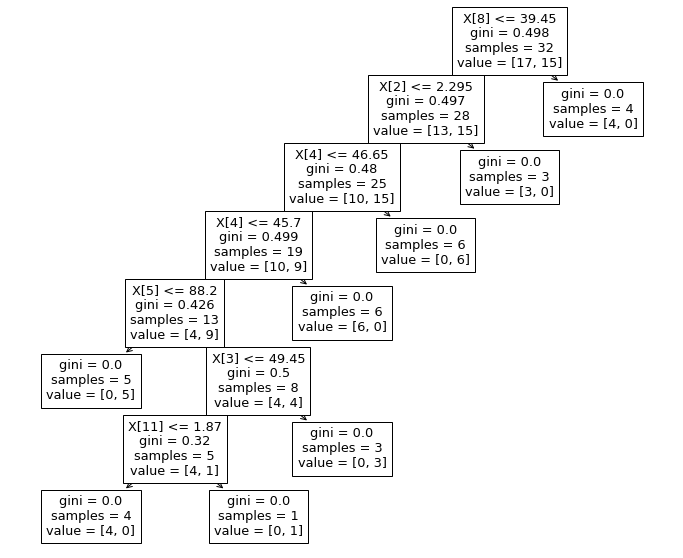

In [274]:
plt.figure(figsize=(12,10))
tree.plot_tree(classifier)
plt.show()

One key observation here is that the tree is unbalanced by having branches only to one side. 

In [275]:
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[2 2]
 [0 4]]
              precision    recall  f1-score   support

           0       1.00      0.50      0.67         4
           1       0.67      1.00      0.80         4

    accuracy                           0.75         8
   macro avg       0.83      0.75      0.73         8
weighted avg       0.83      0.75      0.73         8



A precision of 1 is odd as well although the only thing that is telling me is that all my positive samples are classified as positive samples and none of the positive samples are classified incorrectly

Lets try to compare the True vs Predicted binary values to see this better:

In [277]:
print("True:     ", y_test.values[0:30]) # These are the real values
print("Predicted:", y_pred[0:30]) # These correspond to the predicted values

True:      [1 0 1 1 1 0 0 0]
Predicted: [1 0 1 1 1 1 1 0]


So, there you go, it is correct what I mentioned previously and all my positives (1) are classified as positives, therefore thee precision is 1. Here the problem is clearly that the sample is very small so not much to do to fix this. 

# 2010 - 2020 Test Dataset

In [38]:
df1 = pd.read_csv('2010-2020_Model_Ready.csv', index_col=0)
print("df1:")
display(df1.head(3))
df2 = pd.read_csv('2000-2010_Model_Ready.csv', index_col=0)
print("=============================================================================")
print("df2:")
display(df2.head(3))

df1:


,Game_Result,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
0,1,96.0,46.5,43.2,38.0,112.2,114.2,46.9,1.89,106.09,86.8,46.3,36.8,38.0,107.5,99.1,51.1,1.26,104.23
1,1,87.5,45.7,29.0,33.6,107.9,96.8,51.4,1.54,101.00,84.0,49.6,29.5,36.7,112.9,107.5,49.6,1.35,101.50
2,1,94.0,41.1,36.2,29.3,103.7,109.6,45.2,1.81,101.80,86.0,46.3,35.8,41.9,104.9,114.2,47.3,1.30,103.00


df2:


,Game_Result,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
0,0,62.0,56.5,9.0,55.6,114.0,89.1,56.6,0.94,92.5,81.0,37.0,15.0,40.0,89.1,114.0,43.4,1.08,92.5
1,0,78.0,41.0,7.0,28.6,87.8,83.7,52.3,0.84,98.0,85.0,36.5,10.0,30.0,83.7,87.8,47.7,1.60,98.0
2,1,72.0,45.8,7.0,57.1,87.8,99.0,53.3,0.74,98.0,79.0,43.0,16.0,37.5,99.0,87.8,46.7,1.33,98.0


In [39]:
# Target Variable
df1['Game_Result'].value_counts()

1    7160
0    5038
Name: Game_Result, dtype: int64

## Features, Labels and Training

In [40]:
# Create features (X) and labels (y)
y = df1['Game_Result']
X = df1.drop(['Game_Result'], axis=1)

In [49]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

## Training Classifier and making predictions

In [50]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [51]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

## Checking predictive performance

In [52]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :61.278688524590166

AUC is :0.6

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,695,560,1255
1,621,1174,1795
All,1316,1734,3050


Accuracy for the 10 year dataset is lower than for 1 year at 61.28%. Lets plot the confusion matrix:

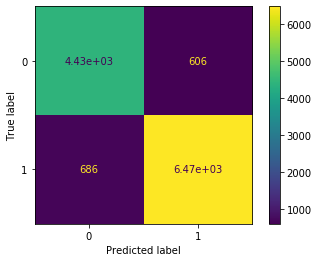

In [46]:
# Alternative confusion matrix
plot_confusion_matrix(classifier, X, y, values_format='.3g')
plt.show()

## Displaying Decision Treee using Entropy

In [47]:
# Instantiate and fit a DecisionTreeClassifier
classifier_2 = DecisionTreeClassifier(random_state=42, criterion='entropy')  
classifier_2.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

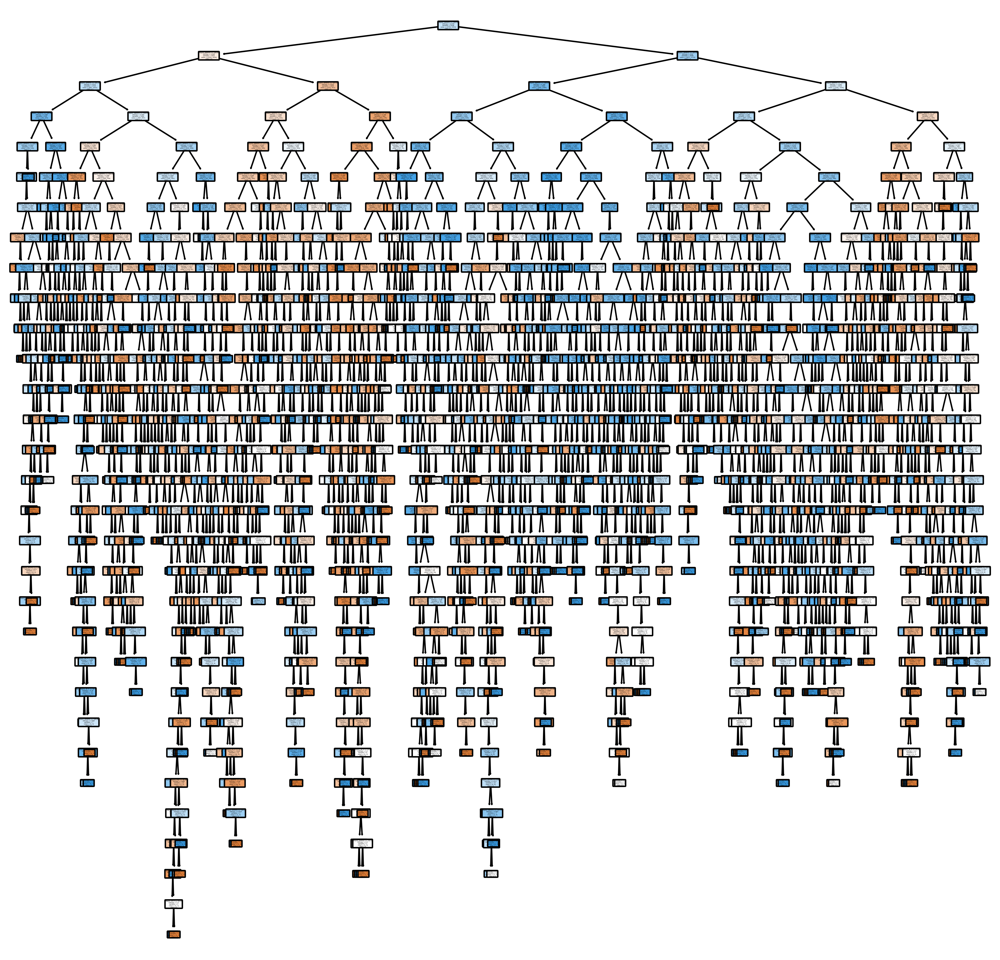

In [48]:
# Plot and show decision tree
plt.figure(figsize=(12,12), dpi=500)
tree.plot_tree(classifier_2, 
               feature_names=X.columns,
               class_names=np.unique(y).astype('str'),
               filled=True, rounded=True)
plt.show()

## Model Test I

In [104]:
df_SAS = pd.read_csv('df_merge_a.csv', index_col=0)
df_SAS.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_year,Team1_month,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_year,Team2_month,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
0,New Orleans Pelicans,122,Toronto Raptors,130,2019,10,1,2019.0,10.0,96.0,46.5,43.2,38.0,112.2,114.2,46.9,1.89,106.09,2019.0,10.0,86.8,46.3,36.8,38.0,107.5,99.1,51.1,1.26,104.23
1,Los Angeles Lakers,102,Los Angeles Clippers,112,2019,10,1,2019.0,10.0,87.5,45.7,29.0,33.6,107.9,96.8,51.4,1.54,101.00,2019.0,10.0,84.0,49.6,29.5,36.7,112.9,107.5,49.6,1.35,101.50


In [105]:
df_SAS = df_SAS[df_SAS['Team2'] == 'San Antonio Spurs']

In [106]:
df_SAS = df_SAS.drop(['Team1', 'Team1Score', 'Team2Score', 'Team2', 'year', 'month', 'Team1_month', 'Team2_month', 'Team1_year', 'Team2_year'], axis=1)

In [107]:
df_SAS.Game_Result.value_counts() 

1    334
0     81
Name: Game_Result, dtype: int64

In [108]:
# Create features (X) and labels (y)
y = df_SAS['Game_Result']
X = df_SAS.drop(['Game_Result'], axis=1)

In [109]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [110]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [111]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

In [112]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :65.38461538461539

AUC is :0.51

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,6,19,25
1,17,62,79
All,23,81,104


## Model Test II

In [123]:
df_MIA = pd.read_csv('df_merge_a.csv', index_col=0)
df_MIA.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_year,Team1_month,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_year,Team2_month,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
0,New Orleans Pelicans,122,Toronto Raptors,130,2019,10,1,2019.0,10.0,96.0,46.5,43.2,38.0,112.2,114.2,46.9,1.89,106.09,2019.0,10.0,86.8,46.3,36.8,38.0,107.5,99.1,51.1,1.26,104.23
1,Los Angeles Lakers,102,Los Angeles Clippers,112,2019,10,1,2019.0,10.0,87.5,45.7,29.0,33.6,107.9,96.8,51.4,1.54,101.00,2019.0,10.0,84.0,49.6,29.5,36.7,112.9,107.5,49.6,1.35,101.50


In [124]:
df_MIA = df_MIA[df_MIA['Team2'] == 'Miami Heat']

In [125]:
df_MIA = df_MIA.drop(['Team1', 'Team1Score', 'Team2Score', 'Team2', 'year', 'month', 'Team1_month', 'Team2_month', 'Team1_year', 'Team2_year'], axis=1)

In [126]:
df_MIA.Game_Result.value_counts() 

1    281
0    128
Name: Game_Result, dtype: int64

In [127]:
# Create features (X) and labels (y)
y = df_MIA['Game_Result']
X = df_MIA.drop(['Game_Result'], axis=1)

In [128]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [129]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [130]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

In [131]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :62.13592233009708

AUC is :0.61

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,17,13,30
1,26,47,73
All,43,60,103


# 2000 - 2020 Test Dataset

In [72]:
print('Shape of df1:', df1.shape)
print('Shape of df2:', df2.shape)

Shape of df1: (12198, 19)
Shape of df2: (15782, 19)


In [73]:
df3 = df1.append(df2)
print('Shape of df3:', df3.shape) # the shape of df3 should be the result of adding df1 + df2

Shape of df3: (27980, 19)


In [301]:
df3.to_csv('2000-2020_Model_Ready')

## Features, Labels and Training

In [74]:
# Create features (X) and labels (y)
y = df3['Game_Result']
X = df3.drop(['Game_Result'], axis=1)

In [75]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

## Training Classifier and making predictions

In [76]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [77]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

## Checking predictive performance

In [78]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :62.416011436740526

AUC is :0.61

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,1520,1291,2811
1,1338,2846,4184
All,2858,4137,6995


This slightly better but still far from being a good predictive model with an accuracy of 62.42%. This will need to be tested for specific teams and see the results

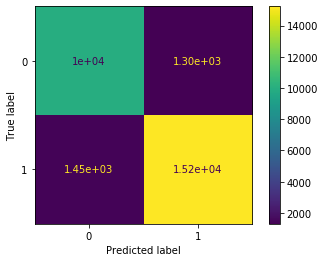

In [79]:
# Alternative confusion matrix
plot_confusion_matrix(classifier, X, y, values_format='.3g')
plt.show()

## Displaying Decision Treee using Entropy

In [80]:
# Instantiate and fit a DecisionTreeClassifier
classifier_2 = DecisionTreeClassifier(random_state=42, criterion='entropy')  
classifier_2.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

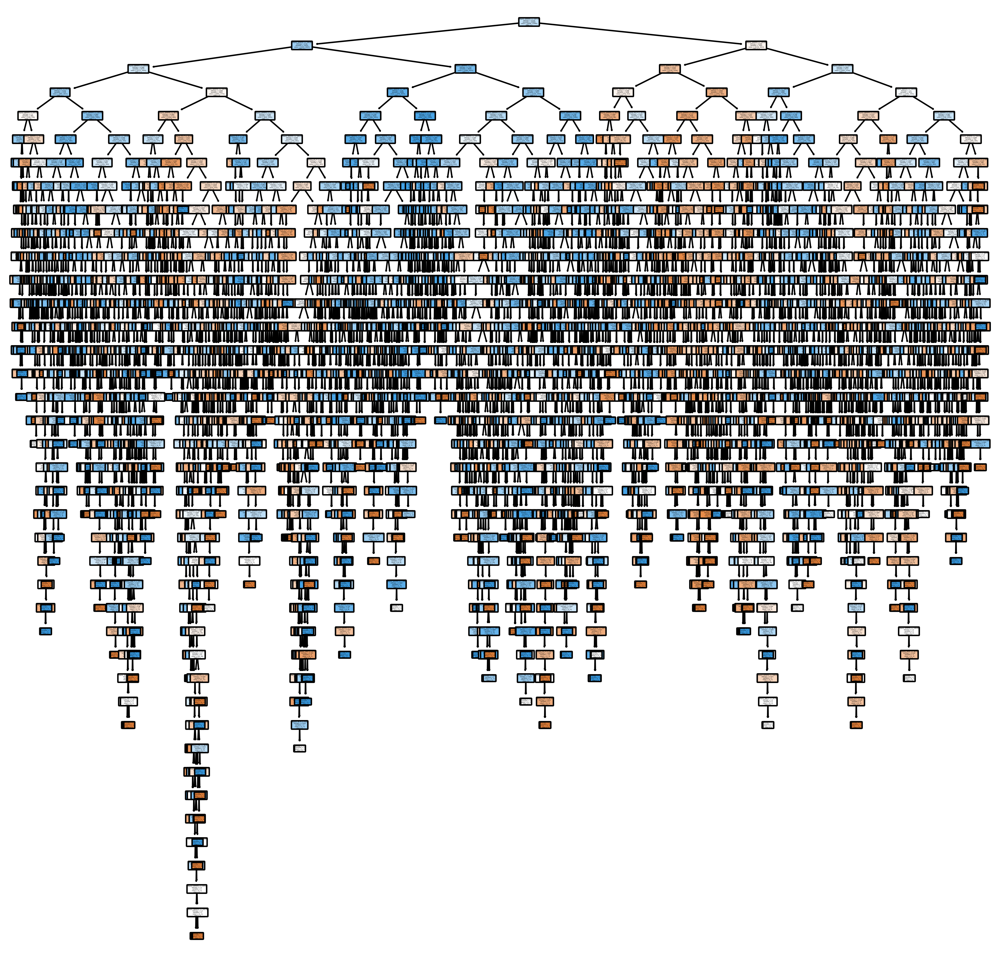

In [81]:
# Plot and show decision tree
plt.figure(figsize=(12,12), dpi=500)
tree.plot_tree(classifier_2, 
               feature_names=X.columns,
               class_names=np.unique(y).astype('str'),
               filled=True, rounded=True)
plt.show()

## Model Test I

In [132]:
df_SAS_a = pd.read_csv('df_merge_a.csv', index_col=0)
df_SAS_b = pd.read_csv('df_merge_b.csv', index_col=0)

In [133]:
df_SAS_a = df_SAS_a[df_SAS_a['Team2'] == 'San Antonio Spurs']
df_SAS_b = df_SAS_b[df_SAS_b['Team2'] == 'San Antonio Spurs']
df_SAS_2 = df_SAS_a.append(df_SAS_b) # This will append both DataFrames
print('Shape of df_SAS_a:', df_SAS_a.shape)
print('Shape of df_SAS_b:', df_SAS_b.shape)
print('Shape of new DataFrame:', df_SAS_2.shape)

Shape of df_SAS_a: (415, 29)
Shape of df_SAS_b: (534, 29)
Shape of new DataFrame: (949, 29)


In [135]:
df_SAS_2.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_year,Team1_month,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_year,Team2_month,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
9,New York Knicks,111,San Antonio Spurs,120,2019,10,1,2019.0,10.0,86.0,42.3,28.4,35.2,99.8,107.9,51.6,1.02,100.80,2019.0,10.0,89.0,47.5,23.0,33.7,108.6,106.2,52.8,1.36,104.75
32,Washington Wizards,122,San Antonio Spurs,124,2019,10,1,2019.0,10.0,94.0,47.9,38.0,38.2,113.6,113.6,49.3,1.69,104.88,2019.0,10.0,89.0,47.5,23.0,33.7,108.6,106.2,52.8,1.36,104.75


In [136]:
df_SAS_2 = df_SAS_2.drop(['Team1', 'Team1Score', 'Team2Score', 'Team2', 'year', 'month', 'Team1_month', 'Team2_month', 'Team1_year', 'Team2_year'], axis=1)
df_SAS_2.head(2)

,Game_Result,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
9,1,86.0,42.3,28.4,35.2,99.8,107.9,51.6,1.02,100.80,89.0,47.5,23.0,33.7,108.6,106.2,52.8,1.36,104.75
32,1,94.0,47.9,38.0,38.2,113.6,113.6,49.3,1.69,104.88,89.0,47.5,23.0,33.7,108.6,106.2,52.8,1.36,104.75


In [137]:
# Create features (X) and labels (y)
y = df_SAS_2['Game_Result']
X = df_SAS_2.drop(['Game_Result'], axis=1)

In [138]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [139]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [140]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

In [141]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :73.52941176470588

AUC is :0.6

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,18,29,47
1,34,157,191
All,52,186,238


## Model Test II

In [142]:
df_MIA_a = pd.read_csv('df_merge_a.csv', index_col=0)
df_MIA_b = pd.read_csv('df_merge_b.csv', index_col=0)

In [143]:
df_MIA_a = df_MIA_a[df_MIA_a['Team2'] == 'Miami Heat']
df_MIA_b = df_MIA_b[df_MIA_b['Team2'] == 'Miami Heat']
df_MIA_2 = df_MIA_a.append(df_MIA_b) # This will append both DataFrames
print('Shape of df_SAS_a:', df_MIA_a.shape)
print('Shape of df_SAS_b:', df_MIA_b.shape)
print('Shape of new DataFrame:', df_MIA_2.shape)

Shape of df_SAS_a: (409, 29)
Shape of df_SAS_b: (535, 29)
Shape of new DataFrame: (944, 29)


In [144]:
df_MIA_2.head(2)

,Team1,Team1Score,Team2,Team2Score,year,month,Game_Result,Team1_year,Team1_month,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_year,Team2_month,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
6,Memphis Grizzlies,101,Miami Heat,120,2019,10,1,2019.0,10.0,95.3,41.5,32.0,28.1,95.7,108.1,48.4,1.32,108.91,2019.0,10.0,85.6,47.0,33.2,39.2,106.6,99.3,52.5,1.19,106.09
51,Atlanta Hawks,97,Miami Heat,112,2019,10,1,2019.0,10.0,85.0,45.6,32.2,29.2,102.0,103.4,49.6,1.36,101.20,2019.0,10.0,85.6,47.0,33.2,39.2,106.6,99.3,52.5,1.19,106.09


In [145]:
df_MIA_2 = df_MIA_2.drop(['Team1', 'Team1Score', 'Team2Score', 'Team2', 'year', 'month', 'Team1_month', 'Team2_month', 'Team1_year', 'Team2_year'], axis=1)
df_MIA_2.head(2)

,Game_Result,Team1_FGA,Team1_FG_P,Team1_3PA,Team1_3P_P,Team1_OFFRTG,Team1_DEFRTG,Team1_REB_P,Team1_AST/TO,Team1_PACE,Team2_FGA,Team2_FG_P,Team2_3PA,Team2_3P_P,Team2_OFFRTG,Team2_DEFRTG,Team2_REB_P,Team2_AST/TO,Team2_PACE
6,1,95.3,41.5,32.0,28.1,95.7,108.1,48.4,1.32,108.91,85.6,47.0,33.2,39.2,106.6,99.3,52.5,1.19,106.09
51,1,85.0,45.6,32.2,29.2,102.0,103.4,49.6,1.36,101.20,85.6,47.0,33.2,39.2,106.6,99.3,52.5,1.19,106.09


In [146]:
# Create features (X) and labels (y)
y = df_MIA_2['Game_Result']
X = df_MIA_2.drop(['Game_Result'], axis=1)

In [147]:
# Perform split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [148]:
# Train a DT classifier
classifier = DecisionTreeClassifier(random_state=42)  
classifier.fit(X_train, y_train) 

DecisionTreeClassifier(random_state=42)

In [149]:
# Make predictions for test data
y_pred = classifier.predict(X_test) 

In [150]:
# Calculate accuracy 
acc = accuracy_score(y_test,y_pred) * 100
print('Accuracy is :{0}'.format(acc))

# Check the AUC for predictions
false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(false_positive_rate, true_positive_rate)
print('\nAUC is :{0}'.format(round(roc_auc, 2)))

# Create and print a confusion matrix 
print('\nConfusion Matrix')
print('----------------')
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Accuracy is :65.2542372881356

AUC is :0.64

Confusion Matrix
----------------


Predicted,0,1,All
True,,,
0,50,37,87
1,45,104,149
All,95,141,236


# Observations/Comments